#**FOOLING SYNTH DETECTOR: CAN YOU SPOT THIS?**
Given a database of synthetic images, design a strategy that fools synthetic image detectors.

Detector reference software:
https://github.com/grip-unina/GANimageDetection

Students: \\
Michele Gusella 2122861 \\
Riccardo Miele  2116946

In this project we have tested various strategies in order to fool a synthetic image detector. The detector used is the one present in the link: `https://github.com/grip-unina/GANimageDetection`

The strategies used are:
*   Addition of a gaussian noise
*   Use of compression
*   Use of rotation
*   Use of mirroring
*   Use of blurring
*   Addition of different geometric shapes to the image

Every strategy is implemented in the corresponding block. First of all, in each block there is the definition of the function that adds the specific modification to an image. Then, there is the creation of a specific folder containing all the images modified with different values of the parameter of the modification. After this, the detector is called on the folder in order to compute the predictions for all the modified images. After all there is the print of the graph of the accuracies showing how the accuracy changes with respect to the values of the parameters varies.

#**How it works in detail**
First of all, there are three main different folders:
*   **aerei**: main folder with both fake and real examples
*   **fake_aerei**: folder with only fake examples
*   **f_aerei_x**: folder with fake examples using **x** method

The name of the file indentifies if the example is fake or not and every image has a number increasing from **0** to the size of the folder minus one. In the main folder (**aerei**) there are **400** examples, **200** real and **200** fake. The real examples have the name ranging from **0** to **199**, whereas the fake ones have the name ranging from **200** to **399**.

In each folder whose name is "**f_aerei_x**", the files' name is formatted as "**number_x=y.png**", where **x** is a letter identifying the type of perturbation applied to that image, and **y** identifies the value of intensity of such perturbation (if there's more than one type of perturbation, **y** contains all the values associated to that attack). \\
Examples: \\
**\f_aerei_noise\200_e=0.25.png** is the image **\aerei\200.png** where gaussian noise with **epsilon=0.25** is applied \\
**\f_aerei_comp\210_q=65.png** is the image **\aerei\210.png** compressed with a quality factor of **65**.

The classificator receives as input the folder with the images and outputs a file (**.csv**) that contains all the predictions made on the images.
The command used to start the predictor is:

`!python ./GANimageDetection/main.py -m ./weights/gandetection_resnet50nodown_stylegan2.pth -i folder_path -o output_file.csv`

The name of **output.csv** is formatted as "**out_f_x.csv**", where **x** indicates the type of attack used to perturb the image.
The **.csv** file contains a table with three columns (filename, logit, time) where "**filename**" is the name of the image, "**logit**" is the value of the prediction and "**time**" is the time taken to process the prediction. The value of logit is a float number (real value) which works like this:
* if it's positive then the prediction corresponds to "fake image"
* if it's negative then the prediction corresponds to "real image".

As mentioned above, we have decided to test different types of perturbations such as:
*   Gaussian noise
*   Compression
*   Rotations
*   Mirroring
*   Addition of different geometric shapes to the image
*   Blurring

Each perturbation was tested with varying intensity values, and afterward, graphs were plotted to better visualize how the classifier's accuracy changes in response to the perturbation intensity.

For each type of attack, the following steps are executed:
* all the images from **/fake_aerei/** are taken, perturbed, and then saved in **/f_aerei_x/**, where as said before **x** represents the type of attack implemented.
* for all perturbed images predictions are computed using the predictor.
* accuracy is computed for every value of intensity of the attack, and then saved in a map where each entry is structured as **[x_value, accuracy_for_x_value]**, where **x_value** is the value of intensity and **accuracy_for_x_value** is the accuracy associated to such intensity.
* finally, this map is used to plot a graph that shows how accuracy changes with respect to the intensity of the attack. Graphs shown are either bar graphs or line graphs depending on the results that we have obtained.

# **Creation of the enviroment**

###Download of classifier and libraries

The following code snippet download the classifier that this project wants to fool.

In [62]:
# Classifier
!git clone https://github.com/grip-unina/GANimageDetection
!mv ./GANimageDetection/example_images/ ./real_images/
!wget -e robots=off -nd -P ./weights -A .pth -r https://www.grip.unina.it/download/prog/GANdetection/weights

fatal: destination path 'GANimageDetection' already exists and is not an empty directory.
mv: cannot stat './GANimageDetection/example_images/': No such file or directory
--2024-02-13 18:53:13--  https://www.grip.unina.it/download/prog/GANdetection/weights
Resolving www.grip.unina.it (www.grip.unina.it)... 143.225.28.237
Connecting to www.grip.unina.it (www.grip.unina.it)|143.225.28.237|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: http://www.grip.unina.it/download/prog/GANdetection/weights/ [following]
URL transformed to HTTPS due to an HSTS policy
--2024-02-13 18:53:14--  https://www.grip.unina.it/download/prog/GANdetection/weights/
Reusing existing connection to www.grip.unina.it:443.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘./weights/weights.tmp’

weights.tmp             [ <=>                ]   8.08K  --.-KB/s    in 0s      

2024-02-13 18:53:14 (112 MB/s) - ‘./weights/weights.tmp’ saved

Importing all the libraries.

In [63]:
import pandas as pd
import tensorflow as tf
from tensorflow import keras

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

import shutil
from io import BytesIO
from PIL import Image, ImageDraw
import random

import re # to sort filenames in array
import cv2

###Download of the dataset

The dataset is taken from the validation set used in **CNNDetection** from https://github.com/PeterWang512/CNNDetection.

That validation set contains images generated by ProGAN and contains 20 classes of various types of objects (the dataset is of 2020). The dataset chosen is the dataset that contains images of airplanes.

In [64]:
#!gdown https://drive.google.com/u/1/uc?id=1aK0GL_oyABJ4g8sLzVf32DPTsIj_JhfI
#!gdown https://drive.google.com/u/1/uc?id=1BOdvz8BD7rtDQbWHclWKbZztaCvColRt
#!unzip aerei.zip

!gdown stops working and outputs this error:

    Failed to retrieve file url:

        Too many users have viewed or downloaded this file recently. Please
        try accessing the file again later. If the file you are trying to
        access is particularly large or is shared with many people, it may
        take up to 24 hours to be able to view or download the file. If you
        still can't access a file after 24 hours, contact your domain
        administrator.

    You may still be able to access the file from the browser:

        https://drive.google.com/u/1/uc?id=1BOdvz8BD7rtDQbWHclWKbZztaCvColRt

    but Gdown can't. Please check connections and permissions.

So we have changed the type of importation using github.

In [65]:
!git clone https://github.com/rickm01/foto_aerei
!unzip foto_aerei/0_aerei.zip
!unzip foto_aerei/1_aerei.zip

fatal: destination path 'foto_aerei' already exists and is not an empty directory.
Archive:  foto_aerei/0_aerei.zip
replace 0_aerei/0.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: Archive:  foto_aerei/1_aerei.zip
replace 1_aerei/200.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In this snippet there is the merging of the two folders in order to have the one that originally was used (the one from the drive).

In [66]:
folder1 = '/content/1_aerei'
folder0 = '/content/0_aerei'

newfolder = '/content/aerei'
shutil.os.makedirs(newfolder, exist_ok=True)

shutil.copytree(folder1, newfolder, dirs_exist_ok=True)
shutil.copytree(folder0, newfolder, dirs_exist_ok=True)

'/content/aerei'

# **Definition of useful functions**

This function reads a csv file printing "**fake**" or "**real**" instead of the raw prediction which is a real number.


In [79]:
def read_output_of_gan(csv_name):
  csv = pd.read_csv(csv_name)

  predictions = csv['logit']
  filenames = csv['filename']
  if len(filenames) != len(predictions):
    print("Error. There's a problem with the CSV file")
    return

  #print(f"\t\tFilename"+"\t\t"+"Prediction".expandtabs(10))
  print("{:^40}\t\t{:^10}".format("Filename", "Prediction"))

  for i in range(len(filenames)):
    label = "Fake"
    if is_real(predictions[i]):
      label = "Real"
    #print(filenames[i] + "\t" + label.expandtabs(10))
    print("{:<40}\t\t{:^10}".format(filenames[i][:40], label))

def print_raw_csv(csv_name):
  csv = pd.read_csv(csv_name)
  print(csv)

# sort csv by filename
def sort_csv(csv_name):
  df = pd.read_csv(csv_name)
  df['numeric_part'] = df['filename'].str.extract(r'(\d+)').astype(int)
  df_sorted = df.sort_values(by='numeric_part')
  df_sorted = df_sorted.drop(columns='numeric_part')
  df_sorted.to_csv(csv_name, index=False)

def extract_number(filename):
  match = re.search(r'(\d+).png', filename)
  return int(match.group(1)) if match else 0

This function is used in the function above in order to outputs the prediction as a boolean value. Remember that the predictior's output:
*   Fake : logit>0 | Label = 1
*   Real : logit<0 | Label = 0


In [80]:
def is_real(score):
  if score < 0:
    return True
  return False

This function prints the corresponding prediction for a given image.

In [81]:
def prediction_for_specific_image(csv, image_name):
  df = pd.read_csv(csv)
  filtered_df = df[df['filename'].str.contains(image_name)]
  logit_value = filtered_df.iloc[0]['logit']
  return "True" if logit_value < 0 else "Fake"

### 0-1 Loss
In this specific context (binary classification), the most appropriate or meaningful loss function to use is the **0-1 loss**.

The **0-1 loss** is calculated by assigning a value of **0** to correct predictions and a value of **1** to incorrect predictions in binary classification scenarios. In other words, if the model correctly classifies an instance into its true class (positive or negative), the loss is **0**. Conversely, if the classification is incorrect, the loss is **1**. This means that the loss can be simply computed as
$$
loss = \frac{number.of.misclassified.elements}{number.of.all.elements}
$$
and you can quickly compute the accuracy as
$$
accuracy = 1 - loss
$$
Even if it's a straightforward loss function, it can be sensitive to small classification errors and does not take into account the confidence or probability associated with the prediction.

In [82]:
# Predictor's output
#Fake : logit>0 | Label = 1
#Real : logit<0 | Label = 0
def zero_one_loss(csv_name, ground_truth_labels):
  csv = pd.read_csv(csv_name)
  data = pd.merge(csv, pd.DataFrame({'filename': csv['filename'], 'ground_truth': ground_truth_labels}), on='filename')
  data['predicted_class'] = (data['logit'] > 0).astype(int)
  zero_one_loss = sum(data['predicted_class'] != data['ground_truth']) / len(data)

  return zero_one_loss

# **Testing the predictor on the dataset**

Let's visualize some of the images in the dataset.

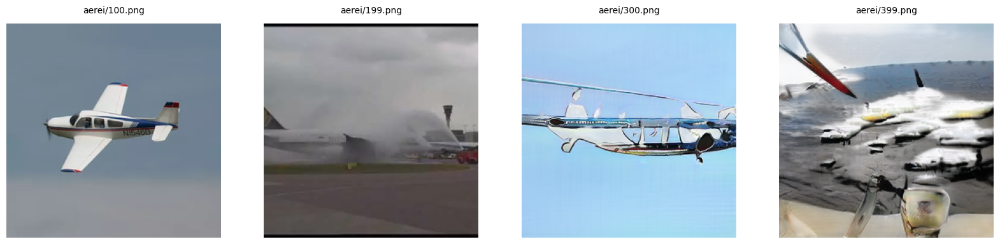

In [ ]:
# Read images from folder and visualize some of them
folder_path = 'aerei'

files = os.listdir(folder_path)
filenames_array_aerei = []

for index, file_name in enumerate(files):
    file_path = os.path.join(folder_path, file_name)
    filenames_array_aerei.append(file_path)

# Sorting filenames based on the numeric part
sorted_filenames = sorted(filenames_array_aerei, key=extract_number)

# Plot only the images whose index is inside indexes
# example: adding 342 to indexes will also display 342.png
indexes = [100, 199, 300, 399]

# To change image size, change figsize=()
fig, axes = plt.subplots(1, len(indexes), figsize=(20, 7))
for i, index in enumerate(indexes):
  img = mpimg.imread(sorted_filenames[index])

  ax = axes[i]
  ax.imshow(img, cmap='gray')
  ax.text(0.5, 1.05, f"{sorted_filenames[index]}", transform=ax.transAxes, size=10, ha='center')
  ax.axis('off')

plt.show()

To test the network on an image folder and to collect the results in a CSV file

In [ ]:
!python ./GANimageDetection/main.py -m ./weights/gandetection_resnet50nodown_stylegan2.pth -i ./aerei/ -o out_aerei_fr.csv

GAN IMAGE DETECTION
START
  399/400
DONE
OUTPUT: out_aerei_fr.csv


Printing the result generated by the GAN

In [ ]:
sort_csv('out_aerei_fr.csv')
read_output_of_gan('out_aerei_fr.csv')

                Filename                		Prediction
./aerei/0.png                           		   Real   
./aerei/1.png                           		   Real   
./aerei/2.png                           		   Real   
./aerei/3.png                           		   Real   
./aerei/4.png                           		   Real   
./aerei/5.png                           		   Real   
./aerei/6.png                           		   Real   
./aerei/7.png                           		   Real   
./aerei/8.png                           		   Real   
./aerei/9.png                           		   Real   
./aerei/10.png                          		   Real   
./aerei/11.png                          		   Real   
./aerei/12.png                          		   Real   
./aerei/13.png                          		   Real   
./aerei/14.png                          		   Real   
./aerei/15.png                          		   Real   
./aerei/16.png                          		   Real   
./aerei/17.png                          		   R

Computing accuracy with **0-1 loss** remembering that:

*   Fake : **logit>0** | **Label = 1**
*   Real : **logit<0** | **Label = 0**

And that:
*   Images from **0** to **199** are real -> **200** zeroes  
*   Images from **200** to **399** are fake -> **200** ones

In [ ]:
# Create ground truth labels as an array with 200 zeros followed by 200 ones because we know what written above
ground_truth_airplanes = np.concatenate((np.zeros(200), np.ones(200)))

accuracy_airplanes = 1-zero_one_loss('out_aerei_fr.csv', ground_truth_airplanes)
print(f'Accuracy of predictor on airplanes dataset without any type of attack: {accuracy_airplanes}')

Accuracy of predictor on airplanes dataset wihtout any type of attack: 1.0


# **Modifying images to spoof the detector**

### **Creation of a subset containing only the fake examples**

In [71]:
!mkdir 'fake_aerei'

source_folder = '/content/aerei'
destination_folder = '/content/fake_aerei'
folder_path = 'fake_aerei'

# To empty the folder if needed
#shutil.rmtree(destination_folder, ignore_errors=True)

fake_filenames_array = []
# This snippets copies all fake images from /aerei/ to the folder /fake_aerei/
for filename in os.listdir(source_folder):
    if int(filename.split('.')[0])>199:
        source_filepath = os.path.join(source_folder, filename)
        destination_filepath = os.path.join(destination_folder, filename)
        shutil.copyfile(source_filepath, destination_filepath)

        file_path = os.path.join(folder_path, filename)
        fake_filenames_array.append(file_path)


print(fake_filenames_array)

mkdir: cannot create directory ‘fake_aerei’: File exists
['fake_aerei/258.png', 'fake_aerei/254.png', 'fake_aerei/359.png', 'fake_aerei/345.png', 'fake_aerei/261.png', 'fake_aerei/316.png', 'fake_aerei/305.png', 'fake_aerei/266.png', 'fake_aerei/365.png', 'fake_aerei/358.png', 'fake_aerei/244.png', 'fake_aerei/211.png', 'fake_aerei/233.png', 'fake_aerei/380.png', 'fake_aerei/323.png', 'fake_aerei/371.png', 'fake_aerei/346.png', 'fake_aerei/347.png', 'fake_aerei/263.png', 'fake_aerei/205.png', 'fake_aerei/344.png', 'fake_aerei/319.png', 'fake_aerei/201.png', 'fake_aerei/251.png', 'fake_aerei/218.png', 'fake_aerei/354.png', 'fake_aerei/385.png', 'fake_aerei/268.png', 'fake_aerei/281.png', 'fake_aerei/241.png', 'fake_aerei/361.png', 'fake_aerei/226.png', 'fake_aerei/204.png', 'fake_aerei/328.png', 'fake_aerei/326.png', 'fake_aerei/379.png', 'fake_aerei/257.png', 'fake_aerei/270.png', 'fake_aerei/247.png', 'fake_aerei/368.png', 'fake_aerei/212.png', 'fake_aerei/360.png', 'fake_aerei/308.pn

## **Gaussian noise**

In [72]:
# Definiton of main functions that generate gaussian noise
def generate_gaussian_noise(image_shape, standard_deviation):
  noise = np.random.normal(0, standard_deviation, size=image_shape)
  return noise

def apply_gaussian_noise(image, epsilon, standard_deviation):
  noise = generate_gaussian_noise(image.shape, standard_deviation)
  noisy_image = image + epsilon*noise
  noisy_image = np.clip(noisy_image, 0, 255).astype(np.uint8)
  return noisy_image

In [73]:
!mkdir 'f_aerei_noise'
epsilon = [0.025, 0.05, 0.075, 0.1, 0.125, 0.15, 0.175, 0.20, 0.225, 0.25]
standard_deviation = 100
folder_name_f_aerei_noise = "f_aerei_noise/"

# For each image in /fake_aerei/
for i in range(len(fake_filenames_array)):
    image = np.array(Image.open(fake_filenames_array[i]))
    path_original_image = folder_name_f_aerei_noise + str(fake_filenames_array[i].split('.')[0]).split("/")[-1] + ".png";
    img_to_save = Image.fromarray(image)
    img_to_save.save(path_original_image)
    # and for each epsilon, add gaussian noise to the input image
    for e in epsilon:
      noisy_image = apply_gaussian_noise(image, e, standard_deviation)
      noisy_image_title = folder_name_f_aerei_noise + str(fake_filenames_array[i].split('.')[0]).split("/")[-1] + "_e=" + str(e)+ ".png";

      img_to_save = Image.fromarray(noisy_image)
      img_to_save.save(noisy_image_title)

mkdir: cannot create directory ‘f_aerei_noise’: File exists


In [74]:
!python ./GANimageDetection/main.py -m ./weights/gandetection_resnet50nodown_stylegan2.pth -i ./f_aerei_noise/ -o out_f_noise.csv

GAN IMAGE DETECTION
START
 2199/2200
DONE
OUTPUT: out_f_noise.csv


Let's visualize some of the perturbed images with gaussian noise.

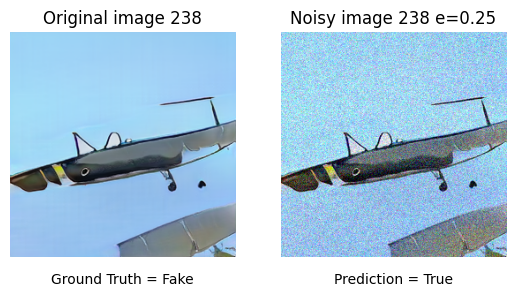

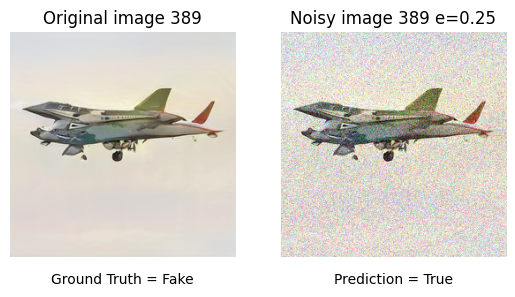

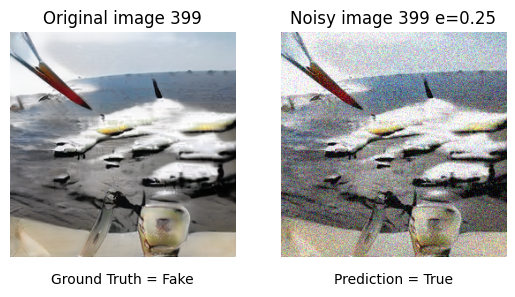

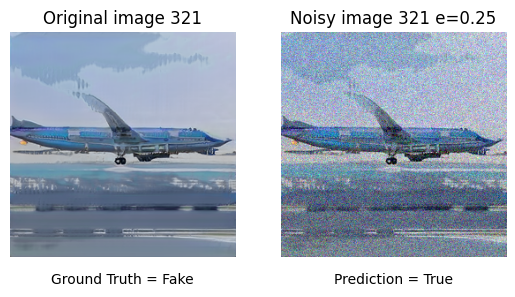

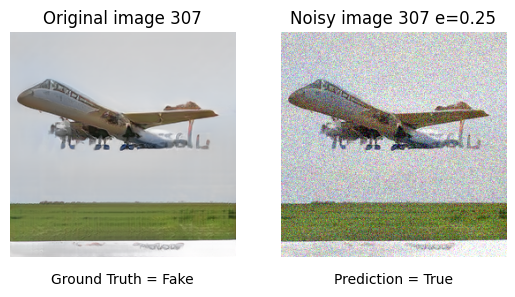

In [75]:
# This snippet prints 5 random original images and their respective noisy images with epsilon=0.25
list_of_indexes = np.random.randint(200, 400, size=5) # generates 5 random integers between 200 and 399

folder_path_up = 'f_aerei_noise/'
files_fake_update = os.listdir(folder_path_up)
fake_filenames_array_up = []

for index, filename in enumerate(files_fake_update):
    if len(filename)==7 or int(filename.split('_')[0])>199:
        file_path = os.path.join(folder_path_up, filename)
        fake_filenames_array_up.append(file_path)

e_value="e=0.25"
for i in list_of_indexes:

    image_name = [filename for filename in fake_filenames_array_up if str(i) in filename and 'e=' not in filename]
    image_name_e = [filename for filename in fake_filenames_array_up if str(i) in filename and e_value in filename]

    image_name = image_name[0]
    image_name_e = image_name_e[0]

    image = np.array(Image.open(str(image_name)))
    noisy_image = np.array(Image.open(str(image_name_e)))

    plt.subplot(1, 2, 1)
    plt.axis('off')
    plt.imshow(image)
    plt.title("Original image " + str(i))
    plt.text(0.5, -0.1, "Ground Truth = " + str(prediction_for_specific_image("out_f_noise.csv", image_name)), ha='center', va='center', transform=plt.gca().transAxes)

    plt.subplot(1, 2, 2)
    plt.axis('off')
    plt.imshow(noisy_image)
    plt.title("Noisy image " + str(i) + " " + e_value)
    plt.text(0.5, -0.1, "Prediction = " + str(prediction_for_specific_image("out_f_noise.csv", image_name_e)), ha='center', va='center', transform=plt.gca().transAxes)

    plt.show()

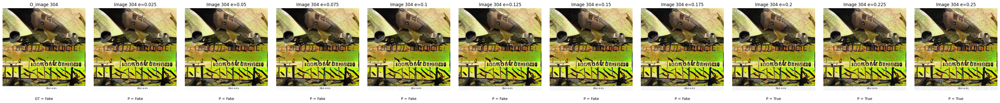

In [76]:
#This shows how the noise affects the image with increasing value of epsilon
index_for_showing = random.randint(200, 400) # generates a random integer between 200 and 399
#277

image_name_s = [filename for filename in fake_filenames_array_up if str(index_for_showing) in filename and 'e=' not in filename]
image_name_s = image_name_s[0]
image = np.array(Image.open(str(image_name_s)))

eps = epsilon

fig_n, axs_n = plt.subplots(1, len(eps)+1, figsize=(50, 10))
# Give the subplot more space
fig_n.subplots_adjust(wspace=0.1)

axs_n[0].imshow(image)
axs_n[0].axis('off')
axs_n[0].set_title("O_image " + str(index_for_showing))
axs_n[0].text(0.5, -0.1,"GT = " + str(prediction_for_specific_image("out_f_noise.csv", image_name_s)), ha='center', va='center', transform=axs_n[0].transAxes)

for i in range(len(eps)):
    image_name_e_s = [filename for filename in fake_filenames_array_up if image_name_s.split('.')[0] in filename and str(eps[i]) + ".png" in filename]

    image_name_e_s = image_name_e_s[0]
    noisy_image = np.array(Image.open(str(image_name_e_s)))

    axs_n[i+1].imshow(noisy_image)
    axs_n[i+1].axis('off')
    axs_n[i+1].set_title("Image " + str(index_for_showing) +" e=" + str(eps[i]))
    axs_n[i+1].text(0.5, -0.1,"P = " + str(prediction_for_specific_image("out_f_noise.csv", image_name_e_s)), ha='center', va='center', transform=axs_n[i+1].transAxes)

plt.show()

### Computing accuracy and plotting it
This snippet computes accuracy of predictor for each value of intensity (epsilon) of the attack.

In [77]:
accuracy_f_noise = [[0.0, 1.0]]

for e in epsilon:
  df = pd.read_csv('out_f_noise.csv')
  df_filtered = df[df['filename'].str.contains(str(e) + ".png")]
  df_filtered.to_csv('temp.csv', index=False)
  ground_truth = np.concatenate([np.ones(df_filtered.shape[0])])
  accuracy_f_noise.append([float(e) , (1-zero_one_loss('temp.csv', ground_truth))])

print(f'Accuracies of predictor on airplanes dataset with gaussian noise: {accuracy_f_noise}')

Accuracies of predictor on airplanes dataset with gaussian noise: [[0.0, 1.0], [0.025, 0.99], [0.05, 0.995], [0.075, 0.965], [0.1, 0.755], [0.125, 0.44499999999999995], [0.15, 0.20999999999999996], [0.175, 0.09499999999999997], [0.2, 0.030000000000000027], [0.225, 0.010000000000000009], [0.25, 0.0050000000000000044]]


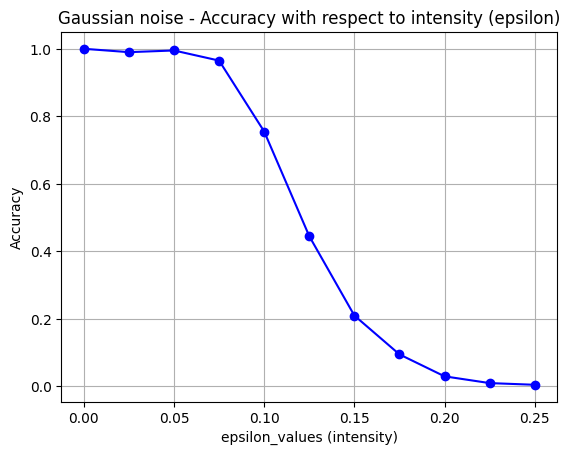

In [78]:
# Finally, visualize the accuracies in a graph
e_values, accuracy_values_e = zip(*accuracy_f_noise)

plt.plot(e_values, accuracy_values_e, marker='o', linestyle='-', color='b')
plt.title('Gaussian noise - Accuracy with respect to intensity (epsilon)')
plt.xlabel('epsilon_values (intensity)')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

##**Compression**

In [ ]:
# Definiton of the main function that compress an image with a given quality factor
def compress_image(image, quality_factor):

    pil_image = Image.fromarray(image)
    compressed_buffer = BytesIO()
    pil_image.save(compressed_buffer, format='JPEG', quality=quality_factor)
    compressed_image = np.array(Image.open(compressed_buffer))

    return compressed_image

In [ ]:
!mkdir 'f_aerei_comp'

quality_factors = [95, 85, 75, 65, 55, 45, 35, 25, 15, 5, 0]

folder_name_f_aerei_comp = "f_aerei_comp/"

# For each image
for i in range(len(fake_filenames_array)):
    image = np.array(Image.open(fake_filenames_array[i]))
    path_original_image = folder_name_f_aerei_comp + str(fake_filenames_array[i].split('.')[0]).split("/")[-1] + ".png";
    img_to_save = Image.fromarray(image)
    img_to_save.save(path_original_image)
    # and for each quality factor, compress the input image
    for q in quality_factors:
      comp_image = compress_image(image, q)
      comp_image_title = folder_name_f_aerei_comp + str(fake_filenames_array[i].split('.')[0]).split("/")[-1] + "_q=" + str(q)+ ".png";

      img_to_save = Image.fromarray(comp_image)
      img_to_save.save(comp_image_title)

In [ ]:
!python ./GANimageDetection/main.py -m ./weights/gandetection_resnet50nodown_stylegan2.pth -i ./f_aerei_comp/ -o out_f_comp.csv

GAN IMAGE DETECTION
START

DONE
OUTPUT: out_f_comp.csv


Let's visualize some of the perturbed images with compression.

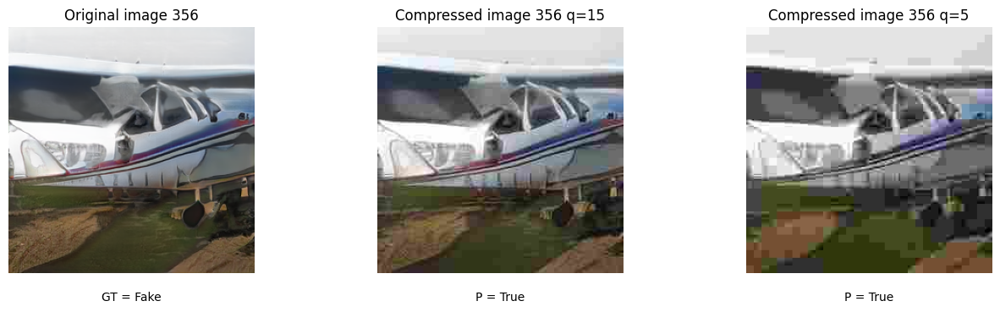

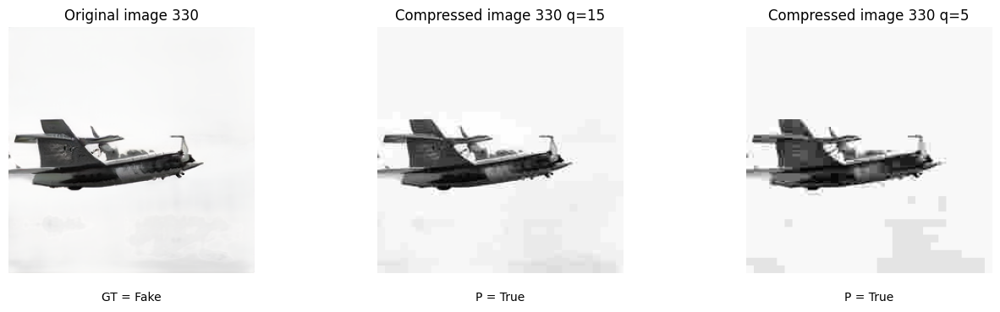

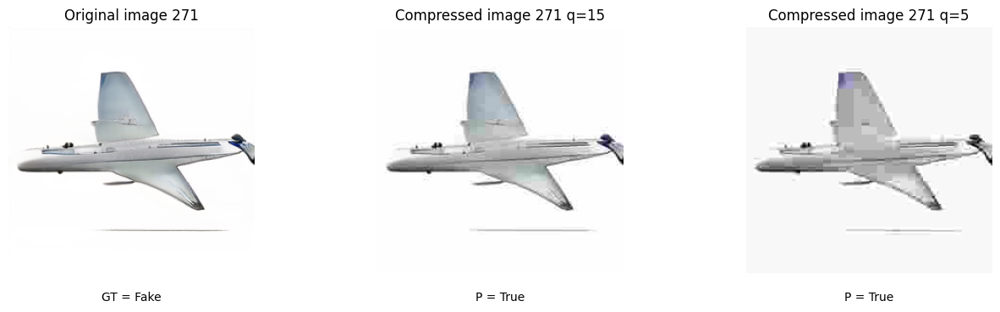

In [86]:
# This snippet prints 3 random original images and their respective compressed images
list_of_indexes = np.random.randint(200, 400, size=3) # generates 3 random integers between 200 and 399

folder_path_up = 'f_aerei_comp/'
files_fake_update = os.listdir(folder_path_up)
fake_filenames_array_up = []

for index, filename in enumerate(files_fake_update):
    if len(filename)==7 or int(filename.split('_')[0])>199:
        file_path = os.path.join(folder_path_up, filename)
        fake_filenames_array_up.append(file_path)

for i in list_of_indexes:

    image_name = [filename for filename in fake_filenames_array_up if str(i) in filename and 'q=' not in filename]
    image_name_e = [filename for filename in fake_filenames_array_up if str(i) in filename and "q=15" in filename]
    image_name_q = [filename for filename in fake_filenames_array_up if str(i) in filename and "q=5.png" in filename]

    image_name = image_name[0]
    image_name_e = image_name_e[0]
    image_name_q = image_name_q[0]

    image = np.array(Image.open(str(image_name)))
    noisy_image = np.array(Image.open(str(image_name_e)))
    noisy_image_q = np.array(Image.open(str(image_name_q)))

    fig_q, axs_q = plt.subplots(1, 3, figsize=(15, 5))
    # Give the subplot more space
    fig_q.subplots_adjust(wspace=0.5)

    axs_q[0].imshow(image)
    axs_q[0].axis('off')
    axs_q[0].set_title("Original image " + str(i))
    axs_q[0].text(0.5, -0.1,"GT = " + str(prediction_for_specific_image("out_f_comp.csv", image_name)), ha='center', va='center', transform=axs_q[0].transAxes)


    axs_q[1].imshow(noisy_image)
    axs_q[1].axis('off')
    axs_q[1].set_title("Compressed image " + str(i) + " q=15")
    axs_q[1].text(0.5, -0.1,"P = " + str(prediction_for_specific_image("out_f_comp.csv", image_name_e)), ha='center', va='center', transform=axs_q[1].transAxes)


    axs_q[2].imshow(noisy_image_q)
    axs_q[2].axis('off')
    axs_q[2].set_title("Compressed image " + str(i) + " q=5")
    axs_q[2].text(0.5, -0.1,"P = " + str(prediction_for_specific_image("out_f_comp.csv", image_name_q)), ha='center', va='center', transform=axs_q[2].transAxes)


    plt.show()

### Computing accuracy and plotting it
This snippet computes accuracy of predictor for each value of quality factor (q).

In [ ]:
accuracy_f_comp = [[100, 1.0]]

for q in quality_factors:
  df = pd.read_csv('out_f_comp.csv')
  df_filtered = df[df['filename'].str.contains("q="+str(q)+".png")]
  df_filtered.to_csv('temp.csv', index=False)
  ground_truth = np.concatenate([np.ones(df_filtered.shape[0])])
  accuracy_f_comp.append([q , (1-zero_one_loss('temp.csv', ground_truth))])

print(f'Accuracies of predictor on airplanes dataset using compression: {accuracy_f_comp}')

Accuracies of predictor on airplanes dataset using compression: [[100, 1.0], [95, 0.985], [85, 0.92], [75, 0.745], [65, 0.75], [55, 0.6799999999999999], [45, 0.655], [35, 0.5700000000000001], [25, 0.54], [15, 0.13], [5, 0.0], [0, 0.0]]


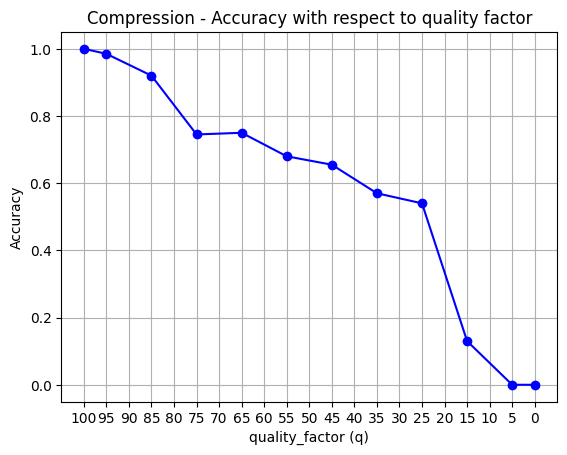

In [ ]:
#Quality factor high -> low  compression
#Quality factor low  -> high compression

q_values, accuracy_values_q = zip(*accuracy_f_comp)

plt.plot(q_values, accuracy_values_q, marker='o', linestyle='-', color='b')
plt.title('Compression - Accuracy with respect to quality factor')
plt.xlabel('quality_factor (q)')
plt.xticks(range(0, 105, 5))
plt.gca().invert_xaxis()
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

##**Rotation**

In [ ]:
# Definiton of the main function that rotates the image given the direction
def apply_rotation(image, direction):
    direction_to_angle = {"up": 0, "left": 90, "down": 180, "right": 270}
    img = Image.fromarray(image)
    rotated_img = img.rotate(direction_to_angle.get(direction))
    rotated_image = np.array(rotated_img)
    return rotated_image

In [ ]:
!mkdir 'f_aerei_rotat'

degrees = ["up", "left", "right", "down"]

folder_name_f_aerei_rotat = "f_aerei_rotat/"

for i in range(len(fake_filenames_array)):
    image = np.array(Image.open(fake_filenames_array[i]))

    for d in degrees:
      rotat_image = apply_rotation(image, d)
      rotat_image_title = folder_name_f_aerei_rotat + str(fake_filenames_array[i].split('.')[0]).split("/")[-1] + "_d=" + str(d)+ ".png";

      img_to_save = Image.fromarray(rotat_image)
      img_to_save.save(rotat_image_title)

In [ ]:
!python ./GANimageDetection/main.py -m ./weights/gandetection_resnet50nodown_stylegan2.pth -i ./f_aerei_rotat/ -o out_f_rotat.csv

GAN IMAGE DETECTION
START
  799/800
DONE
OUTPUT: out_f_rotat.csv


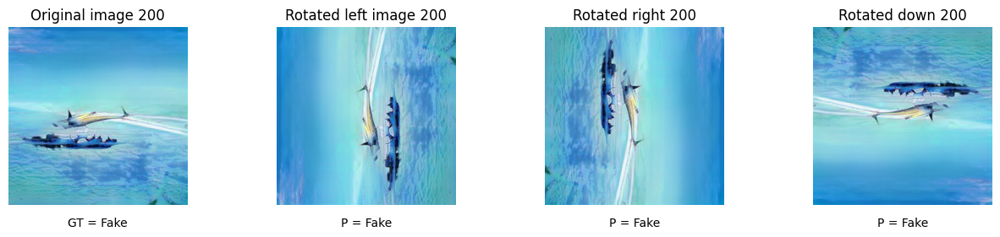

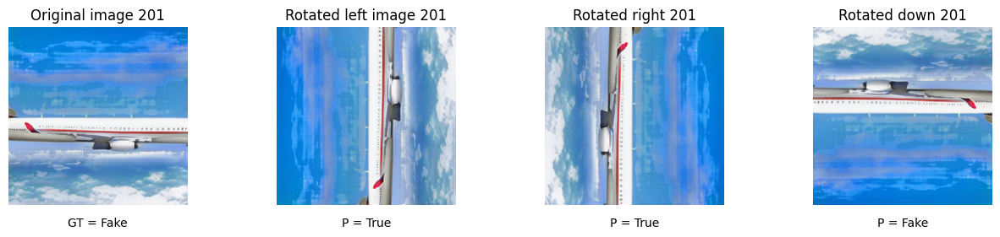

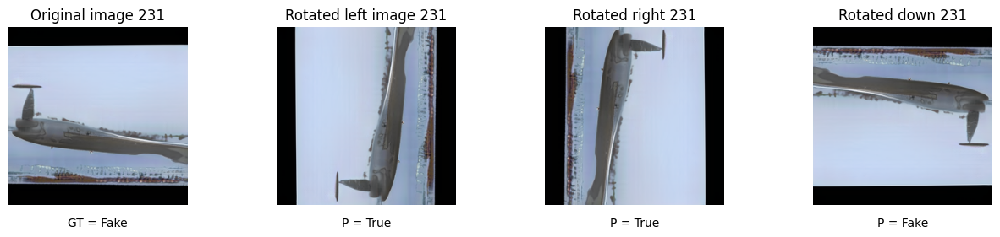

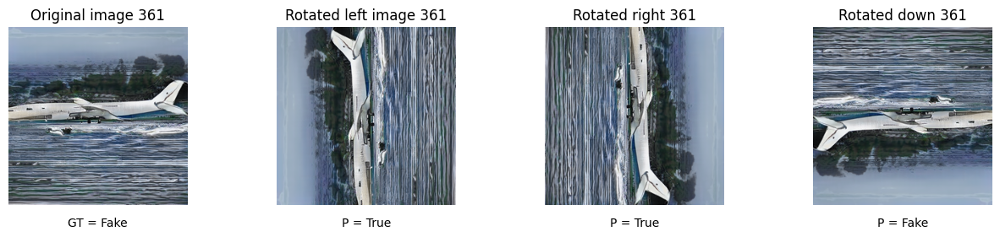

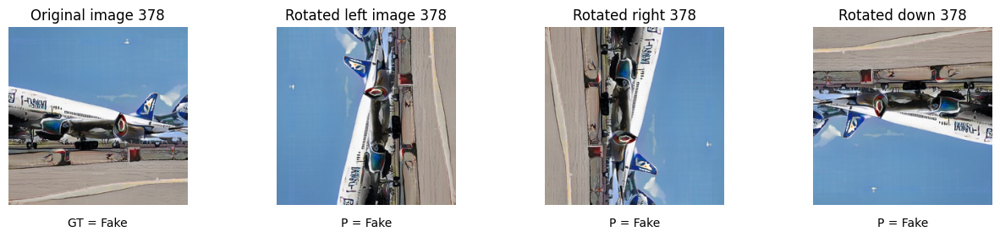

In [ ]:
# This snippet prints 5 random original images and their respective rotated images
list_of_indexes = [200, 201, 231, 361, 378] #201, 231, 361 are the images that rotation fools the detector

folder_path_up = 'f_aerei_rotat/'
files_fake_update = os.listdir(folder_path_up)
fake_filenames_array_up = []

for index, filename in enumerate(files_fake_update):
    if len(filename)==7 or int(filename.split('_')[0])>199:
        file_path = os.path.join(folder_path_up, filename)
        fake_filenames_array_up.append(file_path)

for i in list_of_indexes:

    image_name = [filename for filename in fake_filenames_array_up if str(i) in filename and 'd=down' in filename]
    image_name_l = [filename for filename in fake_filenames_array_up if str(i) in filename and "d=left" in filename]
    image_name_r = [filename for filename in fake_filenames_array_up if str(i) in filename and "d=right" in filename]
    image_name_u = [filename for filename in fake_filenames_array_up if str(i) in filename and "d=up" in filename]

    image_name_d = image_name[0]
    image_name_l = image_name_l[0]
    image_name_r = image_name_r[0]
    image_name_u = image_name_u[0]

    down_image = np.array(Image.open(str(image_name_d)))
    left_image = np.array(Image.open(str(image_name_l)))
    right_image = np.array(Image.open(str(image_name_r)))
    up_image = np.array(Image.open(str(image_name_u)))

    fig_r, axs_r = plt.subplots(1, 4, figsize=(15, 5))
    # Give the subplot more space
    fig_r.subplots_adjust(wspace=0.5)

    axs_r[0].imshow(up_image)
    axs_r[0].axis('off')
    axs_r[0].set_title("Original image " + str(i))
    axs_r[0].text(0.5, -0.1,"GT = " + str(prediction_for_specific_image("out_f_rotat.csv", image_name_u)), ha='center', va='center', transform=axs_r[0].transAxes)


    axs_r[1].imshow(left_image)
    axs_r[1].axis('off')
    axs_r[1].set_title("Rotated left image " + str(i))
    axs_r[1].text(0.5, -0.1,"P = " + str(prediction_for_specific_image("out_f_rotat.csv", image_name_l)), ha='center', va='center', transform=axs_r[1].transAxes)


    axs_r[2].imshow(right_image)
    axs_r[2].axis('off')
    axs_r[2].set_title("Rotated right " + str(i))
    axs_r[2].text(0.5, -0.1,"P = " + str(prediction_for_specific_image("out_f_rotat.csv", image_name_r)), ha='center', va='center', transform=axs_r[2].transAxes)

    axs_r[3].imshow(down_image)
    axs_r[3].axis('off')
    axs_r[3].set_title("Rotated down " + str(i))
    axs_r[3].text(0.5, -0.1,"P = " + str(prediction_for_specific_image("out_f_rotat.csv", image_name_d)), ha='center', va='center', transform=axs_r[3].transAxes)


    plt.show()

### Computing accuracy and plotting it
This snippet computes accuracy of predictor for each degree of rotation

In [ ]:
accuracy_f_rotat = []

for d in degrees:
  df = pd.read_csv('out_f_rotat.csv')
  df_filtered = df[df['filename'].str.contains(str(d)+".png")]
  df_filtered.to_csv('temp.csv', index=False)
  ground_truth = np.concatenate([np.ones(df_filtered.shape[0])])
  accuracy_f_rotat.append([d , (1-zero_one_loss('temp.csv', ground_truth))])


print(f'Accuracy of predictor on airplanes dataset with rotation: {accuracy_f_rotat}')

Accuracy of predictor on airplanes dataset with rotation: [['up', 1.0], ['left', 0.985], ['right', 0.985], ['down', 1.0]]


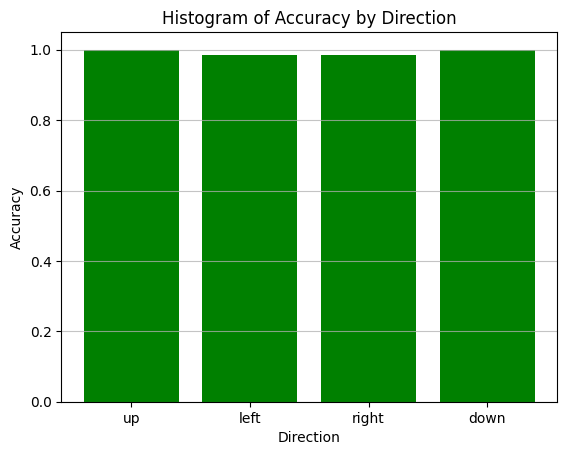

In [ ]:
d_values, accuracy_values_d = zip(*accuracy_f_rotat)

plt.bar(d_values, accuracy_values_d, color='g')
plt.title('Histogram of Accuracy by Direction')
plt.xlabel('Direction')
plt.ylabel('Accuracy')
plt.grid(axis='y', alpha=0.75)

plt.show()

##**Mirror**

In [ ]:
# Definiton of the main function that mirrors the image
def apply_mirror(image):

    image_array = np.array(image)
    mirrored_array = np.fliplr(image_array)
    mirrored_image = Image.fromarray(mirrored_array)

    return mirrored_image

In [ ]:
!mkdir 'f_aerei_mirror'

mirrors = ["on"]

folder_name_f_aerei_mirror = "f_aerei_mirror/"

for i in range(len(fake_filenames_array)):
    image = np.array(Image.open(fake_filenames_array[i]))
    path_original_image = folder_name_f_aerei_mirror + str(fake_filenames_array[i].split('.')[0]).split("/")[-1] + ".png";
    img_to_save = Image.fromarray(image)
    img_to_save.save(path_original_image)

    for m in mirrors:
      mirror_image = apply_mirror(image)
      mirror_image_title = folder_name_f_aerei_mirror + str(fake_filenames_array[i].split('.')[0]).split("/")[-1] + "_m=" + str(m)+ ".png";

      img_to_save = mirror_image
      img_to_save.save(mirror_image_title)

In [ ]:
!python ./GANimageDetection/main.py -m ./weights/gandetection_resnet50nodown_stylegan2.pth -i ./f_aerei_mirror/ -o out_f_mirror.csv

GAN IMAGE DETECTION
START
  399/400
DONE
OUTPUT: out_f_mirror.csv


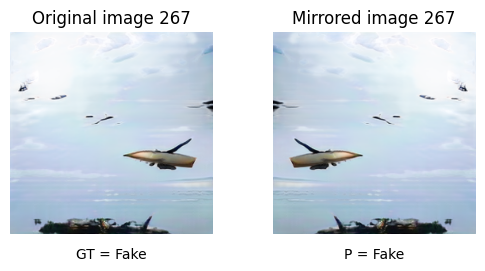

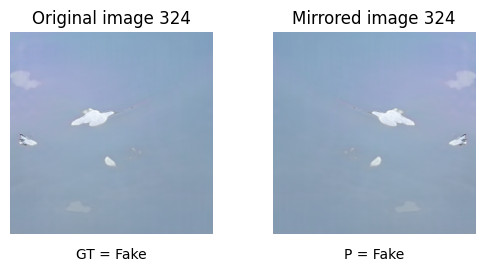

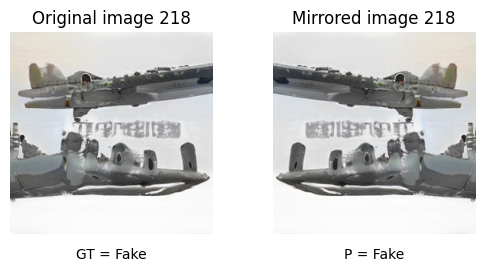

In [ ]:
# This snippet prints 3 random original images and their respective mirrored images
list_of_indexes = np.random.randint(200, 400, size=3) # generates 3 random integers between 200 and 399

folder_path_up = 'f_aerei_mirror/'
files_fake_update = os.listdir(folder_path_up)
fake_filenames_array_up = []

for index, filename in enumerate(files_fake_update):
    if len(filename)==7 or int(filename.split('_')[0])>199:
        file_path = os.path.join(folder_path_up, filename)
        fake_filenames_array_up.append(file_path)

for i in list_of_indexes:

    image_name = [filename for filename in fake_filenames_array_up if str(i) in filename and 'm=' not in filename]
    image_name_m = [filename for filename in fake_filenames_array_up if str(i) in filename and "m=on" in filename]

    image_name = image_name[0]
    image_name_m = image_name_m[0]

    image = np.array(Image.open(str(image_name)))
    mirror_image = np.array(Image.open(str(image_name_m)))

    fig_m, axs_m = plt.subplots(1, 2, figsize=(6, 3))
    # Give the subplot more space
    fig_m.subplots_adjust(wspace=0.3)

    axs_m[0].imshow(image)
    axs_m[0].axis('off')
    axs_m[0].set_title("Original image " + str(i))
    axs_m[0].text(0.5, -0.1,"GT = " + str(prediction_for_specific_image("out_f_mirror.csv", image_name)), ha='center', va='center', transform=axs_m[0].transAxes)


    axs_m[1].imshow(mirror_image)
    axs_m[1].axis('off')
    axs_m[1].set_title("Mirrored image " + str(i))
    axs_m[1].text(0.5, -0.1,"P = " + str(prediction_for_specific_image("out_f_mirror.csv", image_name_m)), ha='center', va='center', transform=axs_m[1].transAxes)


    plt.show()

### Computing accuracy and plotting it


In [ ]:
accuracy_f_mirror = [['off', 1.0]]

for m in mirrors:
  df = pd.read_csv('out_f_mirror.csv')
  df_filtered = df[df['filename'].str.contains(str(m)+".png")]
  df_filtered.to_csv('temp.csv', index=False)
  ground_truth = np.concatenate([np.ones(df_filtered.shape[0])])
  accuracy_f_mirror.append([m , (1-zero_one_loss('temp.csv', ground_truth))])


print(f'Accuracy of predictor on airplanes dataset with mirroring: {accuracy_f_mirror}')

Accuracy of predictor on airplanes dataset with mirroring: [['off', 1.0], ['on', 1.0]]


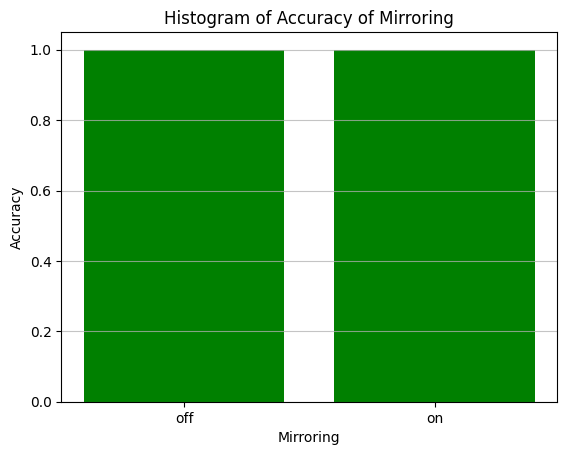

In [ ]:
m_values, accuracy_values_m = zip(*accuracy_f_mirror)

plt.bar(m_values, accuracy_values_m, color='g')
plt.title('Histogram of Accuracy of Mirroring')
plt.xlabel('Mirroring')
plt.ylabel('Accuracy')
plt.grid(axis='y', alpha=0.75)

plt.show()

The mirroring does not influence the accuracy at all.

##**Shape**

In [ ]:
# Definiton of main function that add a given number of a given type of geometric shape of a given color (the size's shape it's fixed given a parameter)
def add_shapes_to_image(image, number_of_shapes, shape_type, size, color, random_seed):
  np.random.seed(random_seed)
  new_image = np.copy(image)

  pil_image = Image.fromarray(new_image)
  draw = ImageDraw.Draw(pil_image)
  img_width, img_height = new_image.shape[:2]

  for _ in range(number_of_shapes):

    x = np.random.randint(0, img_width - size)
    y = np.random.randint(0, img_height - size)

    if shape_type == 'triangle':
        points = [(x, y), (x + size, y), (x + size // 2, y + size)]
        draw.polygon(points, fill=color)
    elif shape_type == 'square':
        draw.rectangle([x, y, x + size, y + size], fill=color)
    elif shape_type == 'rectangle':
        draw.rectangle([x, y, x + size * 2, y + size], fill=color)
    elif shape_type == 'circle':
        draw.ellipse([x, y, x + size, y + size], fill=color)

  new_image = np.array(pil_image)

  return new_image

In [ ]:
!mkdir 'f_aerei_shape'

#[number_of_shapes, type_of_shape, dimension_of_shape, color_of_shape]
shapes = [[1, "square", 20 ,'white'], [1, "square", 20 ,'black'],
          [5, "square", 20 ,'white'],[5, "square", 20 ,'black'],
          [10, "square", 20 ,'white'], [10, "square", 20 ,'black'],

          [1, "rectangle", 20 ,'white'], [1, "rectangle", 20 ,'black'],
          [5, "rectangle", 20 ,'white'],[5, "rectangle", 20 ,'black'],
          [10, "rectangle", 20 ,'white'], [10, "rectangle", 20 ,'black'],

          [1, "triangle", 20 ,'white'], [1, "triangle", 20 ,'black'],
          [5, "triangle", 20 ,'white'],[5, "triangle", 20 ,'black'],
          [10, "triangle", 20 ,'white'], [10, "triangle", 20 ,'black'],

          [1, "circle", 20 ,'white'], [1, "circle", 20 ,'black'],
          [5, "circle", 20 ,'white'],[5, "circle", 20 ,'black'],
          [10, "circle", 20 ,'white'], [10, "circle", 20 ,'black']

          #[15, "triangle", 20 ,'black'], [20, "triangle", 20 ,'black'],
          #[25, "triangle", 20 ,'white'], [30, "triangle", 20 ,'black'],

           ]


folder_name_f_aerei_shape = "f_aerei_shape/"
random_seed=12345

for i in range(len(fake_filenames_array)):
  image = np.array(Image.open(fake_filenames_array[i]))
  path_original_image = folder_name_f_aerei_shape + str(fake_filenames_array[i].split('.')[0]).split("/")[-1] + ".png";
  img_to_save = Image.fromarray(image)
  img_to_save.save(path_original_image)

  for s in shapes:
    shape_image = add_shapes_to_image(image, s[0], s[1], s[2], s[3], random_seed)

    shape_image_title = folder_name_f_aerei_shape + str(fake_filenames_array[i].split('.')[0]).split("/")[-1] + "_s=" + str(s[0]) + "-"+ str(s[1]) + "-" + str(s[3][0]) + ".png";

    img_to_save = Image.fromarray(shape_image)
    img_to_save.save(shape_image_title)

In [ ]:
!python ./GANimageDetection/main.py -m ./weights/gandetection_resnet50nodown_stylegan2.pth -i ./f_aerei_shape/ -o out_f_shape.csv

GAN IMAGE DETECTION
START
 4999/5000
DONE
OUTPUT: out_f_shape.csv


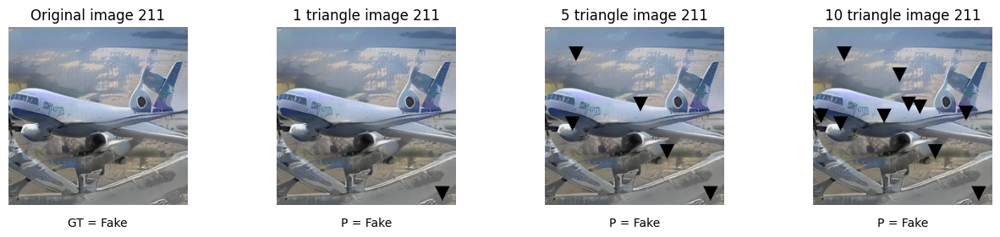

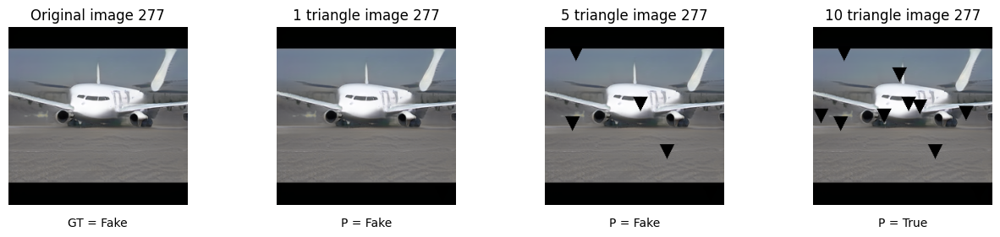

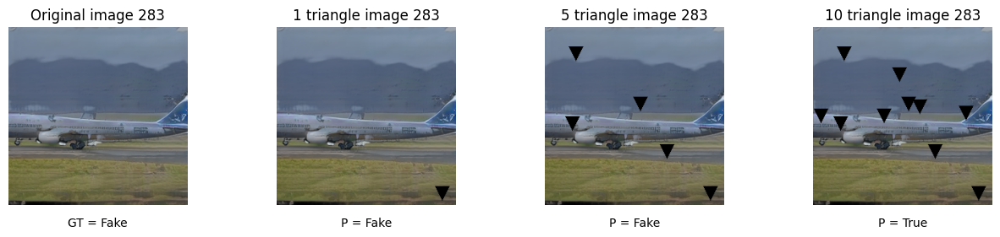

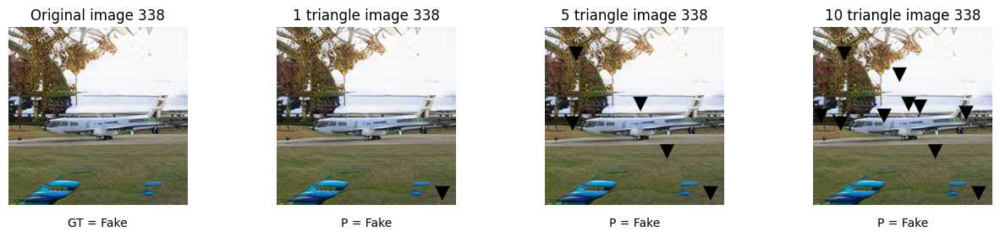

In [ ]:
# This snippet prints 5 random original images and their respective rotated images
list_of_indexes = np.random.randint(200, 400, size=3) # generates 3 random integers between 200 and 399
list_of_indexes = np.insert(list_of_indexes, 1, 283)
list_of_indexes.sort()

folder_path_up = 'f_aerei_shape/'
files_fake_update = os.listdir(folder_path_up)
fake_filenames_array_up = []

for index, filename in enumerate(files_fake_update):
    if len(filename)==7 or int(filename.split('_')[0])>199:
        file_path = os.path.join(folder_path_up, filename)
        fake_filenames_array_up.append(file_path)

for i in list_of_indexes:

    image_name = [filename for filename in fake_filenames_array_up if str(i) in filename and 's=' not in filename]
    image_name_1t = [filename for filename in fake_filenames_array_up if str(i) in filename and "s=1-triangle-b" in filename]
    image_name_5t = [filename for filename in fake_filenames_array_up if str(i) in filename and "s=5-triangle-b" in filename]
    image_name_10t = [filename for filename in fake_filenames_array_up if str(i) in filename and "s=10-triangle-b" in filename]

    image_name = image_name[0]
    image_name_1t = image_name_1t[0]
    image_name_5t = image_name_5t[0]
    image_name_10t = image_name_10t[0]

    image = np.array(Image.open(str(image_name)))
    image_1t = np.array(Image.open(str(image_name_1t)))
    image_5t = np.array(Image.open(str(image_name_5t)))
    image_10t = np.array(Image.open(str(image_name_10t)))

    fig_s, axs_s = plt.subplots(1, 4, figsize=(15, 5))
    # Give the subplot more space
    fig_s.subplots_adjust(wspace=0.5)

    axs_s[0].imshow(image)
    axs_s[0].axis('off')
    axs_s[0].set_title("Original image " + str(i))
    axs_s[0].text(0.5, -0.1,"GT = " + str(prediction_for_specific_image("out_f_shape.csv", image_name)), ha='center', va='center', transform=axs_s[0].transAxes)


    axs_s[1].imshow(image_1t)
    axs_s[1].axis('off')
    axs_s[1].set_title("1 triangle image " + str(i))
    axs_s[1].text(0.5, -0.1,"P = " + str(prediction_for_specific_image("out_f_shape.csv", image_name_1t)), ha='center', va='center', transform=axs_s[1].transAxes)


    axs_s[2].imshow(image_5t)
    axs_s[2].axis('off')
    axs_s[2].set_title("5 triangle image " + str(i))
    axs_s[2].text(0.5, -0.1,"P = " + str(prediction_for_specific_image("out_f_shape.csv", image_name_5t)), ha='center', va='center', transform=axs_s[2].transAxes)

    axs_s[3].imshow(image_10t)
    axs_s[3].axis('off')
    axs_s[3].set_title("10 triangle image " + str(i))
    axs_s[3].text(0.5, -0.1,"P = " + str(prediction_for_specific_image("out_f_shape.csv", image_name_10t)), ha='center', va='center', transform=axs_s[3].transAxes)


    plt.show()

### Computing accuracy and plotting it

In [89]:
shapes = ["square", "rectangle", "triangle", "circle"]
accuracy_f_shape = []

for shape in shapes:
    df = pd.read_csv('out_f_shape.csv')
    df_filtered = df[df['filename'].str.contains(shape)]
    df_filtered.to_csv('temp.csv', index=False)
    ground_truth = np.ones(df_filtered.shape[0])
    accuracy = 1 - zero_one_loss('temp.csv', ground_truth)
    accuracy_f_shape.append([shape, accuracy])

print(f'Accuracy of predictor on type of shapes dataset: {accuracy_f_shape}')

Accuracy of predictor on type of shapes dataset: [['square', 0.8741666666666666], ['rectangle', 0.8583333333333334], ['triangle', 0.8341666666666667], ['circle', 0.9125]]


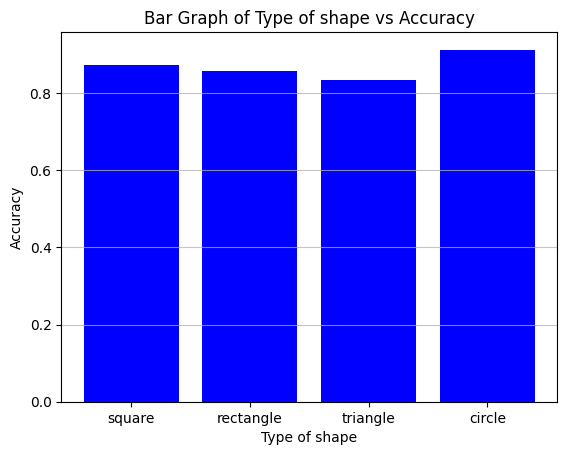

In [88]:
s_values, accuracy_values_s = zip(*accuracy_f_shape)

plt.bar(s_values, accuracy_values_s, color='b')
plt.title('Bar Graph of Type of shape vs Accuracy')
plt.xlabel('Type of shape')
plt.ylabel('Accuracy')
plt.grid(axis='y', alpha=0.75)

plt.show()

We can see that the type of shape influences the accuracy.

In [ ]:
numbers_of_shapes = [1, 5, 10]
accuracy_f_n_shapes = []

for n in numbers_of_shapes:
    df = pd.read_csv('out_f_shape.csv')
    df_filtered = df[df['filename'].str.contains("s=" + str(n) + "-")]
    df_filtered.to_csv('temp.csv', index=False)
    ground_truth = np.ones(df_filtered.shape[0])
    accuracy = 1 - zero_one_loss('temp.csv', ground_truth)
    accuracy_f_n_shapes.append([n, accuracy])

print(f'Accuracy of predictor on number of shapes dataset: {accuracy_f_n_shapes}')

Accuracy of predictor on number of shapes dataset: [[1, 1.0], [5, 0.9225], [10, 0.686875]]


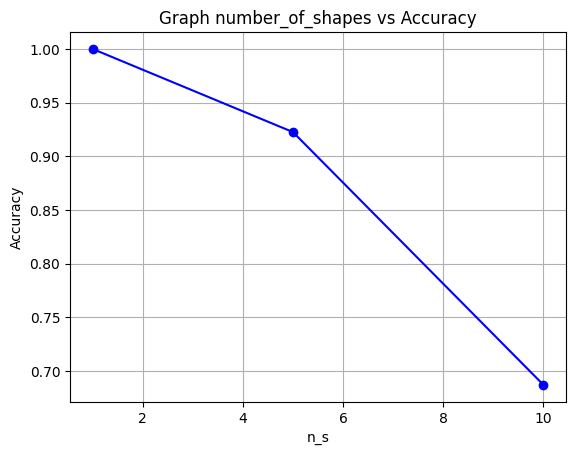

In [90]:
n_s_values, accuracy_values_n_s = zip(*accuracy_f_n_shapes)

plt.plot(n_s_values, accuracy_values_n_s, marker='o', linestyle='-', color='b')
plt.title('Graph number_of_shapes vs Accuracy')
plt.xlabel('n_s')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

Increasing the number of shapes reduce the accuracy.  

In [ ]:
colors_of_shapes = ["w", "b"]
accuracy_f_c_shapes = []

for c in colors_of_shapes:
    df = pd.read_csv('out_f_shape.csv')
    df_filtered = df[df['filename'].str.contains(c+".png")]
    df_filtered.to_csv('temp.csv', index=False)
    ground_truth = np.ones(df_filtered.shape[0])
    accuracy = 1 - zero_one_loss('temp.csv', ground_truth)
    accuracy_f_c_shapes.append([c, accuracy])

print(f'Accuracy of predictor on colors of shapes dataset: {accuracy_f_c_shapes}')

Accuracy of predictor on colors of shapes dataset: [['w', 0.88875], ['b', 0.8508333333333333]]


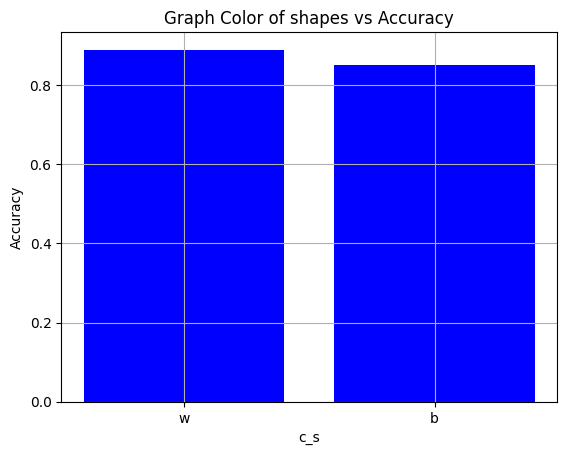

In [91]:
c_s_values, accuracy_values_c_s = zip(*accuracy_f_c_shapes)

plt.bar(c_s_values, accuracy_values_c_s, color='b')
plt.title('Graph Color of shapes vs Accuracy')
plt.xlabel('c_s')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

The color of the shape influence little the accuracy.

##**Blurring**

In [ ]:
# Definiton of the main function that apply the blurring on the image given a parameter
def apply_blurring(image, kernel_size):

    image_array = np.array(image)
    blurred_array = cv2.GaussianBlur(image_array, (kernel_size, kernel_size), 0)
    blurred_image = Image.fromarray(blurred_array)

    return blurred_image

In [ ]:
!mkdir 'f_aerei_blur'

blur = [1, 11, 17, 21, 23, 25] #with 26 the function doesn't work

folder_name_f_aerei_blur = "f_aerei_blur/"

for i in range(len(fake_filenames_array)):
    image = np.array(Image.open(fake_filenames_array[i]))
    path_original_image = folder_name_f_aerei_blur + str(fake_filenames_array[i].split('.')[0]).split("/")[-1] + ".png";
    img_to_save = Image.fromarray(image)
    img_to_save.save(path_original_image)

    for b in blur:
      blur_image = apply_blurring(image, b)
      blur_image_title = folder_name_f_aerei_blur + str(fake_filenames_array[i].split('.')[0]).split("/")[-1] + "_b=" + str(b)+ ".png";

      img_to_save = blur_image
      img_to_save.save(blur_image_title)

In [ ]:
!python ./GANimageDetection/main.py -m ./weights/gandetection_resnet50nodown_stylegan2.pth -i ./f_aerei_blur/ -o out_f_blur.csv

GAN IMAGE DETECTION
START
 1399/1400
DONE
OUTPUT: out_f_blur.csv


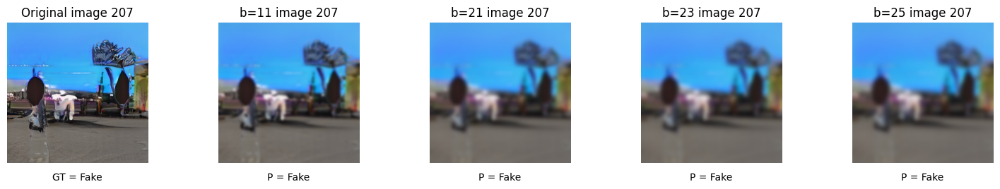

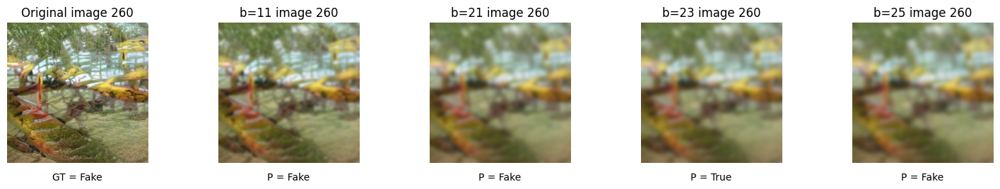

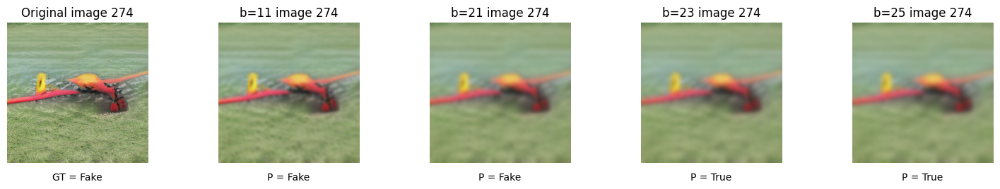

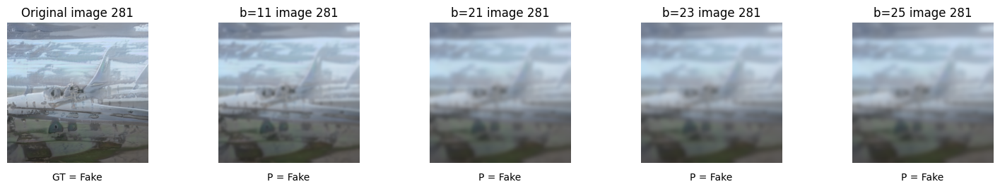

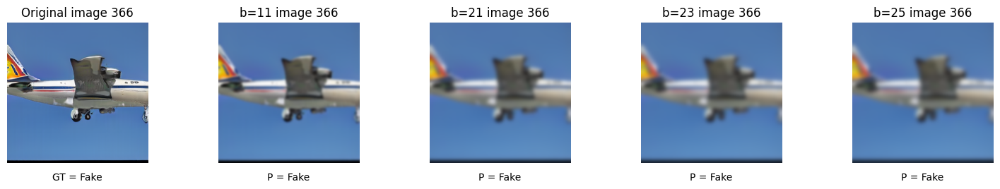

In [ ]:
# This snippet prints 5 random original images and their respective blurred images
list_of_indexes = np.random.randint(200, 400, size=3) # generates 3 random integers between 200 and 399
list_of_indexes = np.insert(list_of_indexes, 2, [260, 274])
list_of_indexes.sort()

folder_path_up = 'f_aerei_blur/'
files_fake_update = os.listdir(folder_path_up)
fake_filenames_array_up = []

for index, filename in enumerate(files_fake_update):
    if len(filename) == 7 or int(filename.split('_')[0]) > 199:
        file_path = os.path.join(folder_path_up, filename)
        fake_filenames_array_up.append(file_path)

for i in list_of_indexes:
    image_name = [filename for filename in fake_filenames_array_up if str(i) in filename and 'b=' not in filename]
    image_name_b11 = [filename for filename in fake_filenames_array_up if str(i) in filename and "b=11" in filename]
    image_name_b21 = [filename for filename in fake_filenames_array_up if str(i) in filename and "b=21" in filename]
    image_name_b23 = [filename for filename in fake_filenames_array_up if str(i) in filename and "b=23" in filename]
    image_name_b25 = [filename for filename in fake_filenames_array_up if str(i) in filename and "b=25" in filename]

    image_name = image_name[0]
    image_name_b11 = image_name_b11[0]
    image_name_b21 = image_name_b21[0]
    image_name_b23 = image_name_b23[0]
    image_name_b25 = image_name_b25[0]

    image = np.array(Image.open(str(image_name)))
    image_b11 = np.array(Image.open(str(image_name_b11)))
    image_b21 = np.array(Image.open(str(image_name_b21)))
    image_b23 = np.array(Image.open(str(image_name_b23)))
    image_b25 = np.array(Image.open(str(image_name_b25)))

    fig_b, axs_b = plt.subplots(1, 5, figsize=(18, 5))
    # Give the subplot more space
    fig_b.subplots_adjust(wspace=0.5)

    axs_b[0].imshow(image)
    axs_b[0].axis('off')
    axs_b[0].set_title("Original image " + str(i))
    axs_b[0].text(0.5, -0.1, "GT = " + str(prediction_for_specific_image("out_f_blur.csv", image_name)),
                  ha='center', va='center', transform=axs_b[0].transAxes)

    axs_b[1].imshow(image_b11)
    axs_b[1].axis('off')
    axs_b[1].set_title("b=11 image " + str(i))
    axs_b[1].text(0.5, -0.1, "P = " + str(prediction_for_specific_image("out_f_blur.csv", image_name_b11)),
                  ha='center', va='center', transform=axs_b[1].transAxes)

    axs_b[2].imshow(image_b21)
    axs_b[2].axis('off')
    axs_b[2].set_title("b=21 image " + str(i))
    axs_b[2].text(0.5, -0.1, "P = " + str(prediction_for_specific_image("out_f_blur.csv", image_name_b21)),
                  ha='center', va='center', transform=axs_b[2].transAxes)

    axs_b[3].imshow(image_b23)
    axs_b[3].axis('off')
    axs_b[3].set_title("b=23 image " + str(i))
    axs_b[3].text(0.5, -0.1, "P = " + str(prediction_for_specific_image("out_f_blur.csv", image_name_b23)),
                  ha='center', va='center', transform=axs_b[3].transAxes)

    axs_b[4].imshow(image_b25)
    axs_b[4].axis('off')
    axs_b[4].set_title("b=25 image " + str(i))
    axs_b[4].text(0.5, -0.1, "P = " + str(prediction_for_specific_image("out_f_blur.csv", image_name_b25)),
                  ha='center', va='center', transform=axs_b[4].transAxes)

    plt.show()

### Computing accuracy and plotting it


In [ ]:
accuracy_f_blur = [[0, 1.0]]

for b in blur:
  df = pd.read_csv('out_f_blur.csv')
  df_filtered = df[df['filename'].str.contains(str(b)+".png")]
  df_filtered.to_csv('temp.csv', index=False)
  ground_truth = np.concatenate([np.ones(df_filtered.shape[0])])
  accuracy_f_blur.append([b , (1-zero_one_loss('temp.csv', ground_truth))])


print(f'Accuracy of predictor on airplanes dataset with blurring: {accuracy_f_blur}')

Accuracy of predictor on airplanes dataset with blurring: [[0, 1.0], [1, 1.0], [11, 1.0], [17, 1.0], [21, 1.0], [23, 0.9900990099009901], [25, 0.995049504950495]]


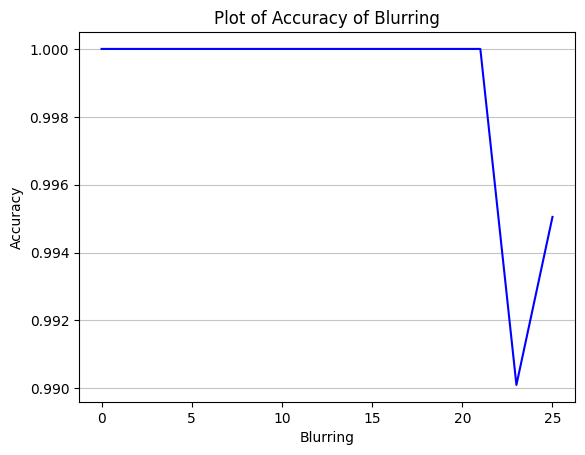

In [ ]:
b_values, accuracy_values_b = zip(*accuracy_f_blur)

plt.plot(b_values, accuracy_values_b, color='b')
plt.title('Plot of Accuracy vs Blurring')
plt.xlabel('Blurring')
plt.ylabel('Accuracy')
plt.grid(axis='y', alpha=0.75)

plt.show()

The blurring influences the accuracy of only few samples so it's not so efficient.

# **Final considerations**
As showed above, we have tested different types of perturbations and we can state that:
*   Gaussian noise with **e=0.25** fools the detector for all the images.
*   Compression with **q=5** fools the detector for all the images.
*   Rotations is not so effective and fools the detector with only in three images.
*   Mirroring is not effective to fool the detector.
*   Addition of different geometric shapes to the image is effective to fool the detector. In fact, with increasing number of shapes the accuracy of the predictor decreases.
*   Blurring is not very effective because fools the detector only with two images.

We can conclude that gaussian noise and compression are the most effective strategies to fool the detector and also addition of shapes seems good. The other strategies are not effective or not so effective.